In [1]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import pandas as pd
import random
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree, export_graphviz
from sklearn.model_selection import train_test_split
from dtreeviz import decision_boundaries
%config InlineBackend.figure_format = 'svg' 
import pltvid
from sklearn.ensemble import RandomForestClassifier

In [2]:
# data generation
k = 8000
x1 = np.random.uniform(-1, 1, size=k)
y1 = random.choices([-1, 1], k=k)*np.sqrt(1-x1**2)

k = 8000
boundary = 0.9999999999
x2 = np.random.uniform(-1, 1, size=k)
r = np.random.uniform(0, boundary, size=k)
y2 = random.choices([-1, 1], k=k)*np.sqrt(r**2-x2**2)

fig = go.Figure(data=go.Scatter(x=x1, y=y1, mode='markers', name='class 0'))
fig.add_trace(go.Scatter(x=x2, y=y2, mode='markers', name='class 1'))
fig.show();

C:\Users\grzesiek\AppData\Local\Temp\ipykernel_8768\1357182899.py:10: RuntimeWarning: invalid value encountered in sqrt


In [3]:
X1 = np.array(list(zip(x1, y1)))
X2 = np.array(list(zip(x2, y2)))
X = np.concatenate([X1, X2])
y = np.concatenate([np.zeros(k), np.ones(k)])

data = pd.DataFrame(X, columns=['x', 'y'])
data['class'] = y
perm = np.random.permutation(len(data))
data = (data.iloc[perm, :]).dropna()

X = data.iloc[:, :-1].values
y = data.iloc[:, 2].values

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [5]:
parameters={
    'criterion':'entropy',# {“gini”, “entropy”, “log_loss”}
    'splitter':'best', # {“best”, “random”}
    'max_depth': 5,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'min_weight_fraction_leaf': 0.0,
    'max_features': None, # int, float or {“auto”, “sqrt”, “log2”}, default=None
    'random_state': None, # int, RandomState instance or None, default=None
    'max_leaf_nodes': None, # int, default=None
    'min_impurity_decrease': 0.0, # float, default=0.0
    'class_weight': None, # dict, list of dict or “balanced”, default=None
    'ccp_alpha': 0.0, # non-negative float, default=0.0
}

clf = DecisionTreeClassifier(
    criterion=parameters['criterion'],
    splitter=parameters['splitter'], 
    max_depth=parameters['max_depth'],
    min_samples_split=parameters['min_samples_split'],
    min_samples_leaf=parameters['min_samples_leaf'],
    min_weight_fraction_leaf=parameters['min_weight_fraction_leaf'],
    max_features=parameters['max_features'],
    random_state=parameters['random_state'],
    max_leaf_nodes=parameters['max_leaf_nodes'],
    min_impurity_decrease=parameters['min_impurity_decrease'],
    class_weight=parameters['class_weight'],
    ccp_alpha=parameters['ccp_alpha']
    )
clf = clf.fit(X_train, y_train)

In [6]:
clf.score(X_test,y_test)

0.9005823627287853

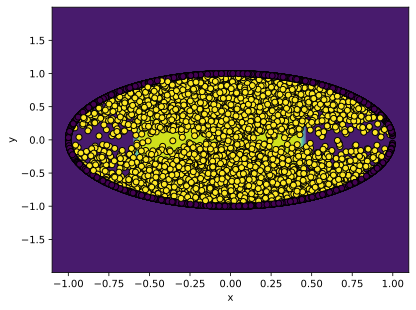

In [7]:
feature_1, feature_2 = np.meshgrid(np.linspace(X[:, 0].min()-0.1, X[:, 0].max()+0.1),
                                   np.linspace(X[:, 1].min()-2, X[:, 1].max())+1)
grid = np.vstack([feature_1.ravel(), feature_2.ravel()]).T
tree = clf.fit(X, y)
y_pred = np.reshape(clf.predict(grid), feature_1.shape)

display = DecisionBoundaryDisplay(xx0=feature_1, xx1=feature_2, response=y_pred, ylabel='y', xlabel='x')
display.plot()
display.ax_.scatter(X[:, 0], X[:, 1], c=y, edgecolor="black");

In [8]:
X1 = np.array(list(zip(x1, y1)))
X2 = np.array(list(zip(x2, y2)))
X = np.concatenate([X1, X2])
y = np.concatenate([np.zeros(k), np.ones(k)])

data = pd.DataFrame(X, columns=['x', 'y'])
data['class'] = y
perm = np.random.permutation(len(data))
data = (data.iloc[perm, :]).dropna()

X = data.iloc[:, :-1].values
y = data.iloc[:, 2].values

max_depth = 8
clf = RandomForestClassifier(max_depth=max_depth)
clf.fit(X, y)

fig, ax = plt.subplots(1,1, figsize=(8, 8))
decision_boundaries(clf, X, y, ax=ax,
       ntiles=50,
       tile_fraction=1, 
       markers=['o','X'], 
       feature_names=['x', 'y'])
ax.set_title(f'Euclidean system: Random forest 100 trees with max_depth={max_depth}, accuracy = {clf.score(X,y)}');

clf = DecisionTreeClassifier(max_depth=1)

r=np.sqrt(X[:, 0]**2+X[:, 1]**2)
phi=np.arctan2(X[:, 1], X[:, 0])
X[:, 0] = r
X[:, 1] = phi

clf.fit(X, y)
fig, ax = plt.subplots(1,1, figsize=(8, 8))
decision_boundaries(clf, X, y, ax=ax,
       ntiles=50,
       tile_fraction=1, 
       markers=['o','X'], 
       feature_names=['R', 'Phi'])
ax.set_title(f'Polar system: Decision tree classification with max_depth=1, accuracy={clf.score(X,y)}');

In [9]:
clf.score(X,y)

1.0

In [48]:
eps = 0.05
fig = go.Figure(data=go.Scatter(x=[0.55, 1], y=[0.5, 0.5], mode='lines', line=dict(color='blue', dash='dash')))
fig.add_trace(go.Scatter(x=[0.55, 0.55], y=[0, 0.5], mode='lines', line=dict(color='blue', dash='dash')))
fig.update_layout(width=700, height=700, showlegend=False)
fig.update_xaxes(range=[0, 1], title='x')
fig.update_yaxes(range=[0, 1], title='y')
fig.show()

In [49]:
eps = 0.05
fig = go.Figure(data=go.Scatter(x=[0.55, 1], y=[0.5, 0.5], mode='lines', line=dict(color='blue', dash='dash')))
fig.add_trace(go.Scatter(x=[0.55, 0.55], y=[0, 0.5], mode='lines', line=dict(color='blue', dash='dash')))
fig.add_trace(go.Scatter(x=np.array([0.55, 0.55])+eps, y=[0, 0.5-eps], mode='lines', line=dict(color='red', dash='dash')))
fig.add_trace(go.Scatter(x=np.array([0.55, 0.55])-eps, y=[0, 0.5+eps], mode='lines', line=dict(color='red', dash='dash')))
fig.add_trace(go.Scatter(x=np.array([0.55-eps, 1]), y=[0.5+eps, 0.5+eps], mode='lines', line=dict(color='red', dash='dash')))
fig.add_trace(go.Scatter(x=np.array([0.55+eps, 1]), y=[0.5-eps, 0.5-eps], mode='lines', line=dict(color='red', dash='dash')))
fig.update_layout(width=700, height=700, showlegend=False)
fig.update_xaxes(range=[0, 1], title='x')
fig.update_yaxes(range=[0, 1], title='y')
fig.show()

In [87]:
size = 200
x = np.random.uniform(0, 1, size=size) 
y = np.random.uniform(0, 1, size=size) 

eps = 0.05
fig = go.Figure(data=go.Scatter(x=[0.55, 1], y=[0.5, 0.5], mode='lines', line=dict(color='black', dash='dash')))
fig.add_trace(go.Scatter(x=[0.55, 0.55], y=[0, 0.5], mode='lines', line=dict(color='black', dash='dash')))
# fig.add_trace(go.Scatter(x=np.array([0.55, 0.55])+eps, y=[0, 0.5-eps], mode='lines', line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=np.array([0.55, 0.55])-eps, y=[0, 0.5+eps], mode='lines', line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=np.array([0.55-eps, 1]), y=[0.5+eps, 0.5+eps], mode='lines', line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=np.array([0.55+eps, 1]), y=[0.5-eps, 0.5-eps], mode='lines', line=dict(color='red', dash='dash')))
fig.update_layout(width=700, height=700, showlegend=False)
fig.update_xaxes(range=[0, 1], title='x')
fig.update_yaxes(range=[0, 1], title='y')

idx0 = np.where((x>=0.6) & (y<=0.45))
fig.add_trace(go.Scatter(x=x[idx0], y=y[idx0], mode='markers', line=dict(color='blue')))
idx1=list(set(np.arange(0,len(x)))-set(idx0[0]))
fig.add_trace(go.Scatter(x=x[idx1], y=y[idx1], mode='markers', line=dict(color='red')))
fig.show()

In [74]:
np.where((x>=0.6) & (y<=0.45))[0]

array([ 1,  2,  3,  6,  8, 16, 17, 21, 23, 24, 26, 28, 32, 37, 47, 60, 69,
       73, 74, 75, 76, 77, 78, 82, 85, 88, 89, 90, 93, 97], dtype=int64)

In [75]:
set(np.arange(0,len(x)))-set(idx0[0])

{0,
 4,
 5,
 7,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 18,
 19,
 20,
 22,
 25,
 27,
 29,
 30,
 31,
 33,
 34,
 35,
 36,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 70,
 71,
 72,
 79,
 80,
 81,
 83,
 84,
 86,
 87,
 91,
 92,
 94,
 95,
 96,
 98,
 99}